In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.datasets import load_iris
from sklearn.metrics import accuracy_score, recall_score, precision_score
from sklearn.model_selection import train_test_split
from sklearn.tree import export_text
from collections import Counter
from sklearn.metrics import classification_report
from sklearn.tree import export_graphviz
import psycopg2
import time

In [2]:
table_cols = [('age_group', 'reporting_phu_city', 'cause_of_infection', 'gender', 'Resolved', 'Fatal', 'Special_Measure_Key')]
fact_table = []

def connect():
    """ Connect to the PostgreSQL database server """
    conn = None
    try:
        # connect to the PostgreSQL server
        print('Connecting to the PostgreSQL database...')
        return psycopg2.connect(
            host="www.eecs.uottawa.ca",
            database="group_21",
            user="****",
            password="****",
            port="15432"
        )
    except (Exception, psycopg2.DatabaseError) as error:
        print(error)


connection = connect()
print('***Connection established***')

cur = connection.cursor()
        
cur.execute('SELECT I.age_group, I.reporting_phu_city,\
            I.cause_of_infection, I.gender, F."Resolved",\
            F."Fatal", F."Special_Measure_Key" FROM fact_table_v2 as F\
            INNER JOIN individuals as I on I.individual_id = F."Individual_Key"')
rows = cur.fetchall()
fact_table = rows
print(fact_table[:10])

cur.close()
connection.close()
print('***Connection terminated***')

Connecting to the PostgreSQL database...
***Connection established***
[('40s', 'Toronto', 'OB', 'FEMALE', 'yes', 'no', 11), ('30s', 'Toronto', 'OB', 'FEMALE', 'yes', 'no', 11), ('90+', 'Toronto', 'OB', 'FEMALE', 'no', 'yes', 11), ('80s', 'Toronto', 'OB', 'FEMALE', 'yes', 'no', 11), ('50s', 'Toronto', 'OB', 'FEMALE', 'yes', 'no', 11), ('30s', 'Toronto', 'OB', 'FEMALE', 'yes', 'no', 11), ('50s', 'Toronto', 'OB', 'FEMALE', 'yes', 'no', 11), ('50s', 'Toronto', 'OB', 'MALE', 'yes', 'no', 11), ('20s', 'Toronto', 'OB', 'FEMALE', 'yes', 'no', 11), ('80s', 'Toronto', 'NO KNOWN EPI LINK', 'FEMALE', 'yes', 'no', 2)]
***Connection terminated***


In [3]:
result_df = pd.DataFrame(fact_table, columns=["age_group", "reporting_phu_city", "cause_of_infection", 
                                               "gender", "Resolved","Fatal","Special_Measure_Key"])
result_df.head()

,age_group,reporting_phu_city,cause_of_infection,gender,Resolved,Fatal,Special_Measure_Key
0,40s,Toronto,OB,FEMALE,yes,no,11
1,30s,Toronto,OB,FEMALE,yes,no,11
2,90+,Toronto,OB,FEMALE,no,yes,11
3,80s,Toronto,OB,FEMALE,yes,no,11
4,50s,Toronto,OB,FEMALE,yes,no,11


### One Hot Encoding
##### Class = Age Group
- create 9 columns with boolean values and check for imbalance
- one hot encoding to turn into 0s and 1s and then more preprocessing to convert those to boolean values

##### Features
- City, Cause of Infection, Gender, Resolved, Fatal, Special Measures

In [4]:
new_result_df = pd.get_dummies(result_df, prefix=["age_group", "reporting_phu_city", "cause_of_infection", "gender", "Resolved", "Fatal"])
new_result_df = pd.concat([new_result_df, result_df["age_group"]], axis=1)
X = new_result_df.values
new_result_df.head()

,Special_Measure_Key,age_group_20s,age_group_30s,age_group_40s,age_group_50s,age_group_60s,age_group_70s,age_group_80s,age_group_90+,age_group_<20,...,cause_of_infection_TRAVEL,gender_FEMALE,gender_GENDER DIVERSE,gender_MALE,gender_UNSPECIFIED,Resolved_no,Resolved_yes,Fatal_no,Fatal_yes,age_group
0,11,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,1,1,0,40s
1,11,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,1,0,30s
2,11,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,1,0,0,1,90+
3,11,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,1,1,0,80s
4,11,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,1,1,0,50s


Special Measures is a bit more complicated so need to do some more processing. Using the sklearn library to handle the complications.

In [5]:
# Create Labeler and Encoder
labelencoder = LabelEncoder()
encoder = OneHotEncoder(dtype=int, handle_unknown='ignore')

In [6]:
# Assigning numerical values and storing in another column
new_result_df['Special_Measure_Key_Tmp'] = labelencoder.fit_transform(new_result_df['Special_Measure_Key'])
new_result_df.head()

,Special_Measure_Key,age_group_20s,age_group_30s,age_group_40s,age_group_50s,age_group_60s,age_group_70s,age_group_80s,age_group_90+,age_group_<20,...,gender_FEMALE,gender_GENDER DIVERSE,gender_MALE,gender_UNSPECIFIED,Resolved_no,Resolved_yes,Fatal_no,Fatal_yes,age_group,Special_Measure_Key_Tmp
0,11,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,1,1,0,40s,6
1,11,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,1,1,0,30s,6
2,11,0,0,0,0,0,0,0,1,0,...,1,0,0,0,1,0,0,1,90+,6
3,11,0,0,0,0,0,0,1,0,0,...,1,0,0,0,0,1,1,0,80s,6
4,11,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,1,0,50s,6


In [7]:
# passing bridge-types-cat column (label encoded values of bridge_types)
enc_df = pd.DataFrame(encoder.fit_transform(new_result_df[['Special_Measure_Key_Tmp']]).toarray())

In [8]:
#  merge with main df bridge_df on key values
new_result_df = new_result_df.join(enc_df)
new_result_df.rename(columns={6: "lockdown", 10: "stage 3 extended to toronto", 2: "Restart", 1: "Gatineau-Ottawa Travel Restriction", 3: "Parks Re-opened"},inplace = True)
new_result_df = new_result_df.drop(['Special_Measure_Key_Tmp'], axis=1)
new_result_df.head()

,Special_Measure_Key,age_group_20s,age_group_30s,age_group_40s,age_group_50s,age_group_60s,age_group_70s,age_group_80s,age_group_90+,age_group_<20,...,Fatal_no,Fatal_yes,age_group,0,Gatineau-Ottawa Travel Restriction,Restart,Parks Re-opened,4,5,lockdown
0,11,0,0,1,0,0,0,0,0,0,...,1,0,40s,0,0,0,0,0,0,1
1,11,0,1,0,0,0,0,0,0,0,...,1,0,30s,0,0,0,0,0,0,1
2,11,0,0,0,0,0,0,0,1,0,...,0,1,90+,0,0,0,0,0,0,1
3,11,0,0,0,0,0,0,1,0,0,...,1,0,80s,0,0,0,0,0,0,1
4,11,0,0,0,1,0,0,0,0,0,...,1,0,50s,0,0,0,0,0,0,1


In [9]:
new_result_df = new_result_df.drop(['Special_Measure_Key', 4, 5], axis=1)
new_result_df.head()

,age_group_20s,age_group_30s,age_group_40s,age_group_50s,age_group_60s,age_group_70s,age_group_80s,age_group_90+,age_group_<20,age_group_UNKNOWN,...,Resolved_no,Resolved_yes,Fatal_no,Fatal_yes,age_group,0,Gatineau-Ottawa Travel Restriction,Restart,Parks Re-opened,lockdown
0,0,0,1,0,0,0,0,0,0,0,...,0,1,1,0,40s,0,0,0,0,1
1,0,1,0,0,0,0,0,0,0,0,...,0,1,1,0,30s,0,0,0,0,1
2,0,0,0,0,0,0,0,1,0,0,...,1,0,0,1,90+,0,0,0,0,1
3,0,0,0,0,0,0,1,0,0,0,...,0,1,1,0,80s,0,0,0,0,1
4,0,0,0,1,0,0,0,0,0,0,...,0,1,1,0,50s,0,0,0,0,1


### Undersampling

In [10]:
from collections import Counter 
Counter(new_result_df['age_group_20s'])

Counter({0: 13125, 1: 2131})

In [11]:
Counter(new_result_df['age_group_30s'])

Counter({0: 13219, 1: 2037})

In [12]:
Counter(new_result_df['age_group_40s'])

Counter({1: 2107, 0: 13149})

In [13]:
Counter(new_result_df['age_group_50s'])

Counter({0: 12859, 1: 2397})

In [14]:
Counter(new_result_df['age_group_60s'])

Counter({0: 13612, 1: 1644})

In [15]:
Counter(new_result_df['age_group_70s'])

Counter({0: 14135, 1: 1121})

In [16]:
Counter(new_result_df['age_group_80s'])

Counter({0: 13569, 1: 1687})

In [17]:
Counter(new_result_df['age_group_90+'])

Counter({0: 13973, 1: 1283})

In [18]:
Counter(new_result_df['age_group_<20'])

Counter({0: 14408, 1: 848})

All classes are highly imbalanced. It's even more clear by plotting 'age group 20s'.

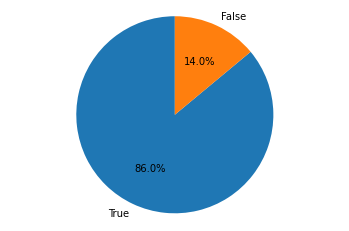

In [19]:
import matplotlib.pyplot as plt

labels = 'True', 'False'
sizes = [13125, 2131]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
ax1.axis('equal')

plt.show()

Therefore, it is likely if we train our model to classify 'age group 20s' on this dataset, during testing it will more often than not predict false.

In [20]:
from sklearn.utils import resample

df_majority = new_result_df[new_result_df.age_group_20s==False]
df_minority = new_result_df[new_result_df.age_group_20s==True]

df_majority_upsampled = resample(df_majority, 
                                 replace=True,     # sample with replacement
                                 n_samples=2131,    # to match minority class
                                 random_state=42)

df_upsampled = pd.concat([df_minority, df_majority_upsampled])

df_upsampled.age_group_20s.value_counts()

0    2131
1    2131
Name: age_group_20s, dtype: int64

In [21]:
# put undersampling into function
def undersample(column_name):
  df_majority = new_result_df[new_result_df[column_name]==False]
  df_minority = new_result_df[new_result_df[column_name]==True]

  df_majority_upsampled = resample(df_majority, 
                                  replace=True,     # sample with replacement
                                  n_samples=len(df_minority.index),    # to match minority class
                                  random_state=42)

  df_upsampled = pd.concat([df_minority, df_majority_upsampled])

  print(df_upsampled[column_name].value_counts())

  return df_upsampled

In [22]:
df_age_group_20s = undersample("age_group_20s")
df_age_group_30s = undersample("age_group_30s")
df_age_group_40s = undersample("age_group_40s")
df_age_group_50s = undersample("age_group_50s")
df_age_group_60s = undersample("age_group_60s")
df_age_group_70s = undersample("age_group_70s")
df_age_group_80s = undersample("age_group_80s")
df_age_group_90 = undersample("age_group_90+")
df_age_group_20 = undersample("age_group_<20")

0    2131
1    2131
Name: age_group_20s, dtype: int64
0    2037
1    2037
Name: age_group_30s, dtype: int64
0    2107
1    2107
Name: age_group_40s, dtype: int64
0    2397
1    2397
Name: age_group_50s, dtype: int64
0    1644
1    1644
Name: age_group_60s, dtype: int64
0    1121
1    1121
Name: age_group_70s, dtype: int64
0    1687
1    1687
Name: age_group_80s, dtype: int64
0    1283
1    1283
Name: age_group_90+, dtype: int64
0    848
1    848
Name: age_group_<20, dtype: int64


In [23]:
classes = {'age_group_20s': df_age_group_20s, 'age_group_30s': df_age_group_30s, 'age_group_40s': df_age_group_40s, 'age_group_50s': df_age_group_50s, 'age_group_60s': df_age_group_60s, 'age_group_70s': df_age_group_70s, 'age_group_80s': df_age_group_80s, 'age_group_90+': df_age_group_90,'age_group_<20': df_age_group_20,  'age_group_UNKNOWN': None}
droppables = ['age_group_30s', 'age_group_40s', 'age_group_50s', 'age_group_20s', 'age_group_60s', 'age_group_70s', 'age_group_80s', 'age_group_90+','age_group_<20', 'age_group_UNKNOWN', 'age_group', 0]
clf = RandomForestClassifier(n_jobs=2, random_state=0)

for name, frame in classes.items():
    if frame is None:
        continue
    print(name, "\n---------------------------------------")
    to_drop = droppables.copy()
    to_drop.remove(name)
    to_drop = list(set(to_drop) & set(frame.axes[1].values))
        
    frame.drop(to_drop, axis=1, inplace=True)
    y = frame[name]
    frame.drop([name], axis=1, inplace=True)
    X = frame.values

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, shuffle=True, stratify=y)

    print("Training set {} ".format(Counter(y_train)))
    print("Test set {} ".format(Counter(y_test)))
    t0 = time.perf_counter()
    clf.fit(X_train, y_train)
    t1 = time.perf_counter() - t0
    print("Accuracy score (training): {0:.3f}".format(clf.score(X_train, y_train)))
    print("Accuracy score (testing): {0:.3f}".format(clf.score(X_test, y_test)))
    print("Time to construct model ", t1)

    predictions = clf.predict(X_test)
    print("Classification Report")
    print(classification_report(y_test, predictions))
    
    print("\n\n")
  

age_group_20s 
---------------------------------------
Training set Counter({0: 1428, 1: 1427}) 
Test set Counter({1: 704, 0: 703}) 
Accuracy score (training): 0.665
Accuracy score (testing): 0.645
Time to construct model  0.2691869020000013
Classification Report
              precision    recall  f1-score   support

           0       0.68      0.55      0.61       703
           1       0.62      0.74      0.68       704

    accuracy                           0.64      1407
   macro avg       0.65      0.64      0.64      1407
weighted avg       0.65      0.64      0.64      1407




age_group_30s 
---------------------------------------
Training set Counter({0: 1365, 1: 1364}) 
Test set Counter({1: 673, 0: 672}) 
Accuracy score (training): 0.611
Accuracy score (testing): 0.587
Time to construct model  0.2624894080000004
Classification Report
              precision    recall  f1-score   support

           0       0.61      0.47      0.53       672
           1       0.57      0.70

In [24]:
feature_names = new_result_df.columns.values.tolist()
for d in droppables:
    feature_names.remove(d)
estimator = clf.estimators_[5]
# Export as dot file
export_graphviz(estimator, 
                out_file='tree.dot', 
                feature_names = feature_names,
                class_names = droppables,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')



['reporting_phu_city_Ottawa', 'reporting_phu_city_Toronto', 'cause_of_infection_CC', 'cause_of_infection_MISSING INFORMATION', 'cause_of_infection_NO KNOWN EPI LINK', 'cause_of_infection_OB', 'cause_of_infection_TRAVEL', 'gender_FEMALE', 'gender_GENDER DIVERSE', 'gender_MALE', 'gender_UNSPECIFIED', 'Resolved_no', 'Resolved_yes', 'Fatal_no', 'Fatal_yes', 'Gatineau-Ottawa Travel Restriction', 'Restart', 'Parks Re-opened', 'lockdown']
